<center><img src="https://minas.medellin.unal.edu.co/images/Escudo_color.png" width="300"></center>

### **<center> <h2><strong>Reconocimiento de señales de tránsito y semaforos</strong></h2> </center>**

<center> <t>[Names]<t> </center>


# <center> <h2><strong>Introducción</strong></h2> </center>


<center> <h3><strong>Contexto</strong></h3> </center>
<p style='text-align: justify'>
    Este proyecto de visión artificial está diseñado para implementarse en un robot móvil, el <a href="https://www.waveshare.com/wave-rover.htm">Wave Rover</a>, equipado con una <a href="https://www.raspberrypi.com/products/raspberry-pi-4-model-b/">Raspberry Pi 4</a> y <a href="https://www.raspberrypi.com/products/camera-module-v2/">Raspberry Pi Camera Module 2</a>, permitiendo el procesamiento de imágenes y videos en tiempo real. Su objetivo es reconocer señales de tráfico y semáforos utilizando técnicas de visión computacional como procesamiento de imágenes y videos, así como el uso de redes neuronales convolucionales. La iniciativa busca mejorar la navegación autónoma del robot y contribuir al desarrollo de la conducción autónoma, empleando la base de datos <a href="https://benchmark.ini.rub.de/">GTSRB</a> (German Traffic Sign Recognition Benchmark), que nos suministra miles de imágenes etiquetadas para entrenar modelos precisos y eficientes. Además, se integrarán algoritmos para detectar estados de semáforos en imágenes estáticas y secuencias de vídeo. Este sistema es ideal para vehículos autónomos y sistemas de asistencia a la conducción. Uno de los objetivo primordiales es diseñar y entrenar modelos de redes neuronales convolucionales (CNN), que puedan identificar y clasificar con precisión una amplia gama de señales de tránsito y los estados de los semáforos en diferentes condiciones ambientales y situaciones de tráfico. Se contempla la recopilación de un extenso dataset que incluya imágenes de señales y semáforos bajo diversas condiciones de iluminación, clima y obstrucciones visuales, lo que permitirá al modelo entrenarse en escenarios que reflejen la complejidad del mundo real. Además, el proyecto abordará el desafío de la integración de estos sistemas de reconocimiento en plataformas de hardware existentes en vehículos.
<p>

<center> <h3><strong>Tecnologia usada</strong></h3> </center>
<p style='text-align: justify'>
    Este proyecto implementa tecnologías como Docker, Conda, Jupyter Notebook, JupyterLab, OpenCV y TensorFlow para asegurar compatibilidad y facilidad de manejo de versiones a través de una imagen de Docker basada en Conda. Configuramos un entorno virtual en Conda con todas las dependencias necesarias, permitiendo la ejecución en cualquier sistema operativo compatible con Docker. Centralizamos todas las funciones en un archivo llamado <a href="https://github.com/GGomezMorales/artificial_vision_project/blob/main/artificial-vision-project/util.py">util.py</a>, diseñado para claridad estructural del proyecto y facilidad de uso, empleando diversas bibliotecas para las operaciones y la lógica requerida. A pesar de la robustez en el manejo de errores y el diseño orientado a objetivos generales, las funciones aún necesitan ser documentadas.
<p>

<p style='text-align: justify'>
    Es importante destacar que todo el proceso se lleva a cabo dentro de un contenedor de Docker. Este contenedor está configurado para integrar un entorno Conda, que contiene todas las dependencias necesarias para el proyecto. Esta configuración permite el uso directo y eficiente del proyecto desde un IDE como Visual Studio Code.
<p>

<p style='text-align: justify'>
    <strong>¿Por qué usar Docker?</strong> Esta tecnología ofrece una plataforma consistente para el desarrollo, lo que elimina los problemas de <i>"funciona en mi máquina"</i> al garantizar que el software se ejecute de manera idéntica en cualquier entorno. Docker facilita la gestión de dependencias y la configuración necesaria para operar el proyecto, asegurando que todas las herramientas y librerías, como OpenCV y TensorFlow, funcionen en un entorno aislado y controlado.
<p>


# <center> <h3><strong>Adquisición de imágenes</strong></h3> </center>


<p style='text-align: justify'>
    El German Traffic Sign Recognition Benchmark (GTSRB) es un conjunto de datos fundamental para el desarrollo de sistemas de reconocimiento de señales de tráfico, esencial para aplicaciones como la conducción autónoma y los sistemas de asistencia al conductor. Tiene las siguientes propiedades:
<p>

<ul>
    <li>Problema de clasificación multiclase de una sola imagen</li>
    <li>Más de 40 clases</li>
    <li>Más de 50.000 imágenes en total</li>
    <li>Base de datos amplia y realista</li>
</ul>

<p style='text-align: justify'>
    GTSRB fue creado por el Instituto de Neuroinformática de la Universidad Ruhr de Bochum, Alemania, y se presentó oficialmente en 2011 durante una competencia en la Conferencia Internacional Conjunta sobre Redes Neuronales (IJCNN). Su objetivo es apoyar el desarrollo y la evaluación de sistemas automáticos para la detección y reconocimiento de señales de tráfico en condiciones reales.
<p>

<p style='text-align: justify'>
    El conjunto de datos contiene más de 50,000 imágenes y abarca 43 clases diferentes de señales de tráfico, que incluyen límites de velocidad, señales de advertencia y signos prohibitivos, entre otros. Las imágenes varían en tamaño, forma y apariencia, e incluyen desafíos como oclusiones parciales, diversas condiciones de iluminación y diferentes distancias y ángulos de captura de la cámara. Cada imagen está acompañada de anotaciones que especifican la clase y las coordenadas del cuadro delimitador de la señal dentro de la imagen.
<p>

<p style='text-align: justify'>
    El GTSRB se divide en un conjunto de entrenamiento con 39,209 imágenes y un conjunto de pruebas con 12,630 imágenes. Esto permite evaluar la eficacia de los modelos entrenados en un entorno controlado. Las anotaciones adicionales incluyen etiquetas de clase y coordenadas de cuadros delimitadores, que son cruciales para tareas de segmentación y reconocimiento.
<p>

<p style='text-align: justify'>
    
<p>


In [41]:
from util import *
from concurrent.futures import ThreadPoolExecutor
from IPython.display import clear_output

<p style='text-align: justify'>
    Creamos una carpeta denominada `/.kaggle` que se utiliza para almacenar las credenciales necesarias para interactuar con los datasets de Kaggle a través de la línea de comandos.
<p>


In [42]:
# ! mkdir -p /.kaggle
# ! cp res/kaggle.json /.kaggle/

# clear_output()

<p style='text-align: justify'>
    Procedimos a descargar el archivo comprimido en una carpeta denominada `/datasets`. Una vez descargado, descomprimimos el contenido y, posteriormente, eliminamos el archivo comprimido para optimizar el espacio de almacenamiento.
<p>


In [44]:
# ! kaggle datasets download -d meowmeowmeowmeowmeow/gtsrb-german-traffic-sign -p /datasets
# ! cd /datasets && mkdir -p data-traffic-sign && cd data-traffic-sign && unzip /datasets/gtsrb-german-traffic-sign.zip
# ! rm /datasets/gtsrb-german-traffic-sign.zip

# clear_output()

# <center> <h3><strong>Preprocesamiento de las imágenes</strong></h3> </center>

<p style='text-align: justify'>
    
<p>


<p style='text-align: justify'>
    Implementaremos varios métodos de preprocesamiento de manera individual para evaluar su impacto y eficacia en la mejora de nuestras imágenes. Posteriormente, integraremos los métodos más efectivos en una secuencia optimizada para lograr el mejor resultado posible. Los datos favorables obtenidos de cada método serán almacenados en arrays, lo que nos permitirá utilizarlos en etapas posteriores del análisis.
<p>


### **Imágenes de prueba**

<p style='text-align: justify'>
    Cargamos y mostramos las imágenes que se utilizarán en el análisis, disponibles tanto en formato RGB como en escala de grises para facilitar diferentes tipos de evaluación. Estas imágenes se han elegido al azar de nuestro dataset.
<p>


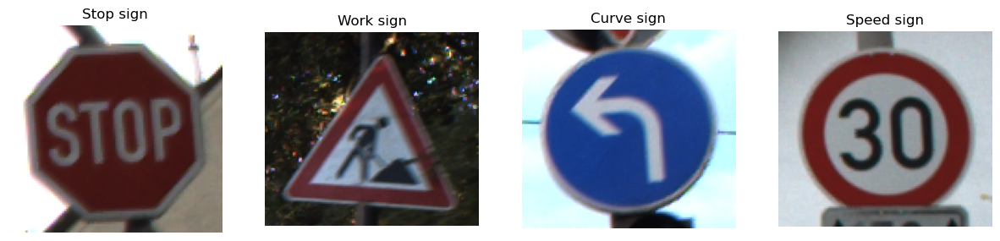

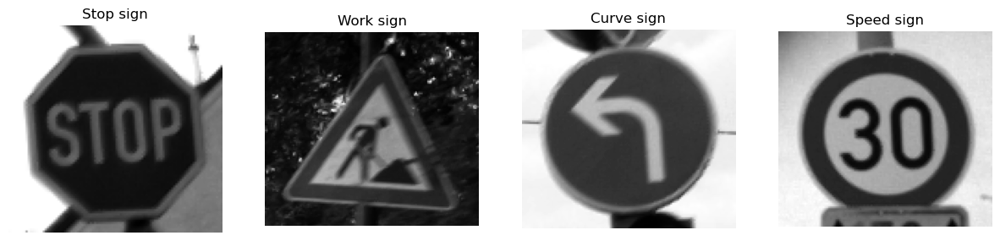

In [43]:
images_info = [
    {"name": "Stop sign", "path": "images/00093.png"},
    {"name": "Work sign", "path": "images/00153.png"},
    {"name": "Curve sign", "path": "images/00433.png"},
    {"name": "Speed sign", "path": "images/00284.png"}
]

original_images, original_images_gray, image_names = read_images(images_info)

# Remember to add the traffic light images

subplot_images(
    images=original_images,
    image_names=image_names
)

subplot_images(
    images=original_images_gray,
    image_names=image_names
)

<p style='text-align: justify'>
    Las imágenes analizadas presentan una baja resolución, variando entre 50x50 y 300x300 píxeles, y en muchos casos muestran altos niveles de ruido y falta de nitidez. Además, la iluminación es insuficiente, lo que afecta aún más su calidad visual. Para abordar estos problemas, se aplicarán diversas técnicas avanzadas, incluyendo filtros para suavizado y eliminación de ruido, correcciones de iluminación, ajustes basados en histogramas y métodos específicos para mejorar la nitidez y la resolución de las imágenes.
<p>


### **Eliminación de ruido**

<p style='text-align: justify'>
    Inicialmente, implementaremos un filtro promedio no local para reducir el ruido, con el objetivo principal de mejorar la resolución y eliminar el ruido de las imágenes.
<p>


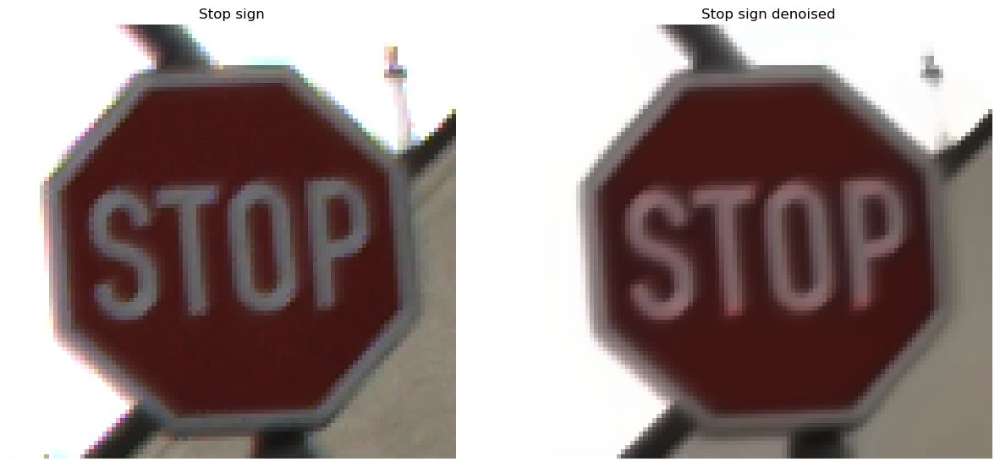

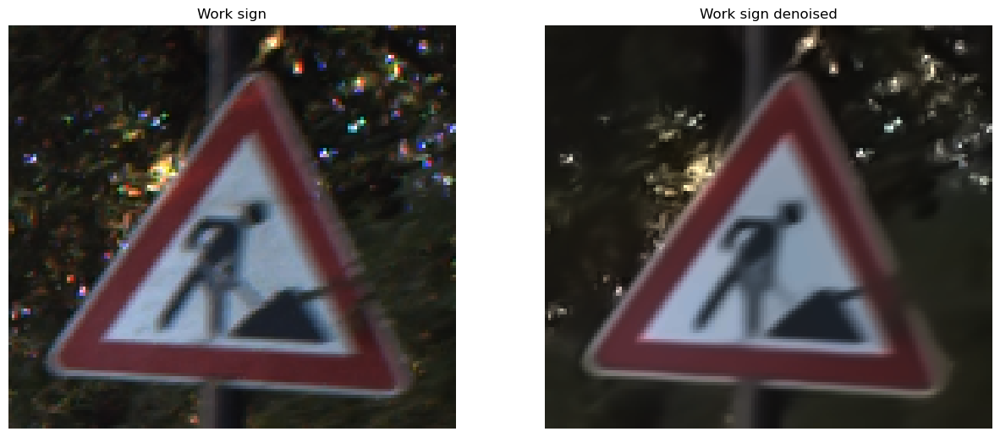

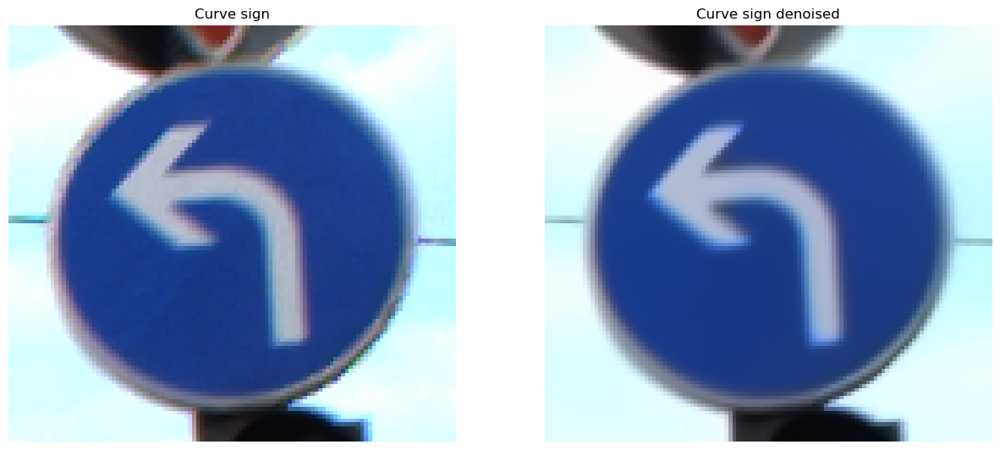

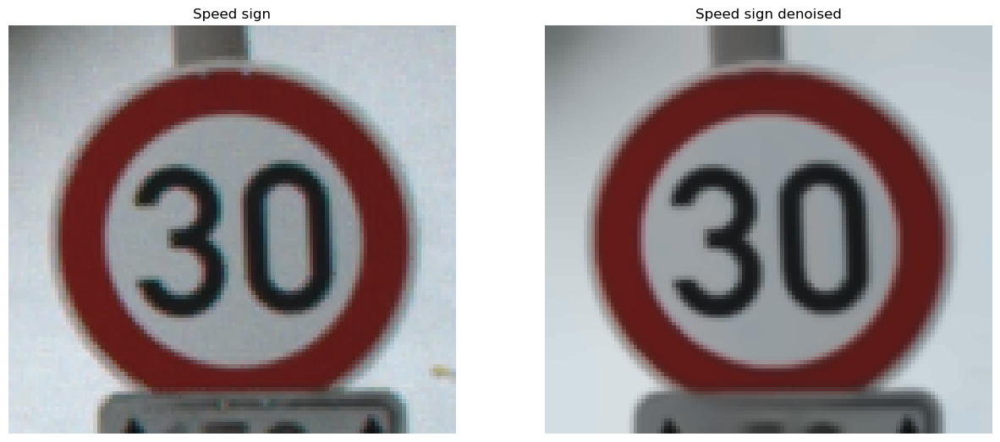

In [45]:
denoised_images = list(
    map(
        lambda image: reduce_noise(image, 10, 10, 7, 21),
        original_images
    )
)

for i in range(4):
    subplot_images(
        images=[original_images[i], denoised_images[i]],
        image_names=[image_names[i], f"{image_names[i]} denoised"]
    )

<p style='text-align: justify'>
    Observamos una gran mejora en las imágenes almacenadas en <code>denoised_images</code>. Las imágenes se ven mucho más limpias, con una reducción significativa del ruido, lo que nos proporciona un mejor resultado y un punto de partida más adecuado para trabajar.
<p>


### **Mejorar la resolución**

<p style='text-align: justify'>
    Aplicaremos una técnica avanzada basada en redes neuronales residuales para la superresolución de imágenes. Estos modelos son capaces de mejorar la calidad de imágenes borrosas o de baja resolución. Utilizan técnicas especiales que permiten a la red aprender a agregar detalles y mejorar la nitidez de las imágenes de manera eficiente. En nuestro caso, utilizaremos el modelo preentrenado EDSR.
<p>

<p style='text-align: justify'>
    El primer paso consiste en descargar el modelo.
<p>


In [46]:
! wget -P ~/ https://github.com/Saafke/EDSR_Tensorflow/raw/master/models/EDSR_x2.pb

clear_output()

<p style='text-align: justify'>
    Para optimizar la ejecución del modelo preentrenado, aplicamos funciones de concurrencia y técnicas de vectorización de datos. Utilizando <code>ThreadPoolExecutor</code>, paralelizamos el proceso de mejora de resolución de las imágenes, lo que permite una ejecución más rápida y eficiente. De esta manera, cada imagen es procesada simultáneamente, mejorando significativamente el rendimiento.
<p>


In [47]:
with ThreadPoolExecutor() as executor:
    enhanced_images_resolution = list(
        executor.map(
            lambda image: enhance_resolution(image, 2, '/root/EDSR_x2.pb'),
            original_images
        )
    )

clear_output()

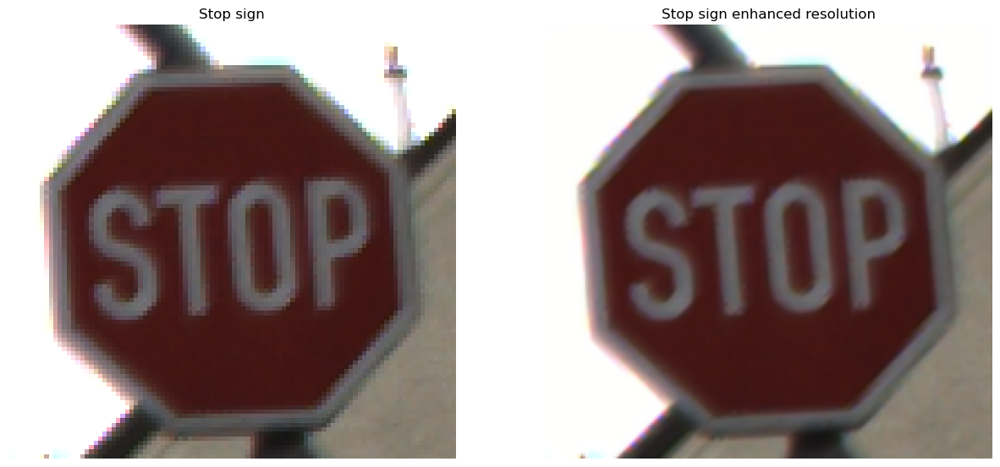

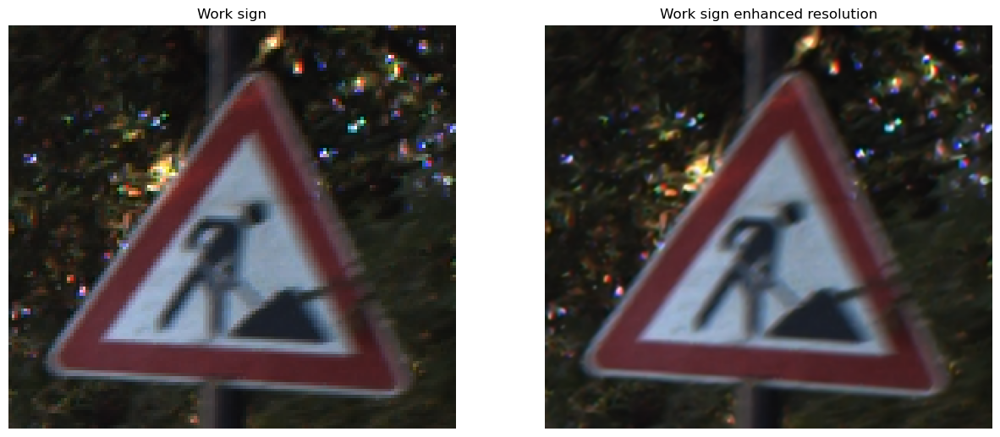

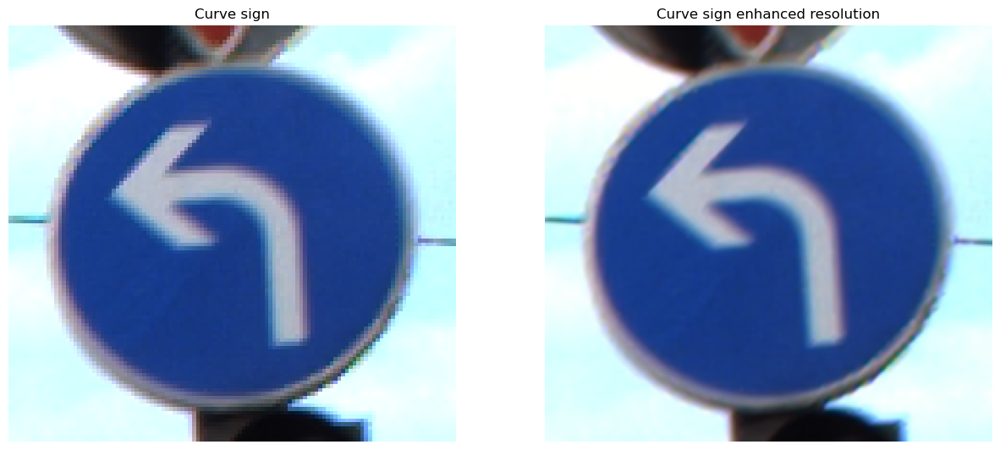

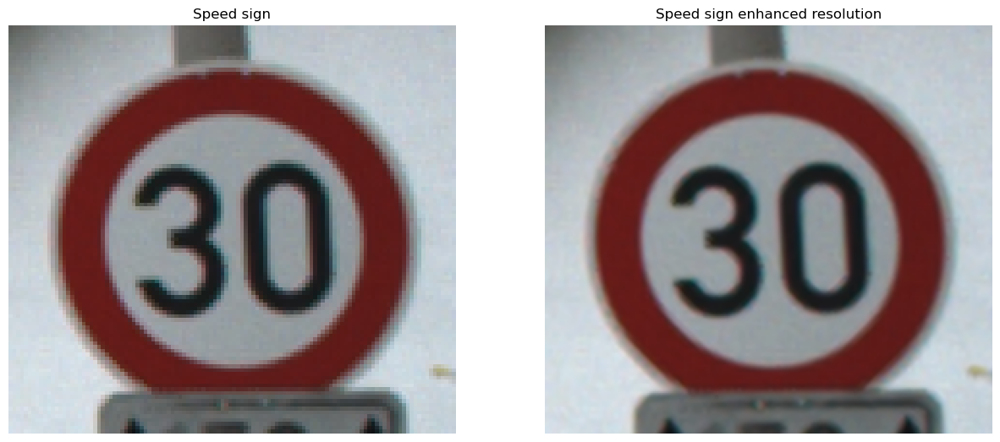

In [48]:
for i in range(len(images_info)):
    subplot_images(
        images=[original_images[i], enhanced_images_resolution[i]],
        image_names=[image_names[i], f"{image_names[i]} enhanced resolution"]
    )

<p style='text-align: justify'>
    Podemos observar que las imágenes almacenadas en <code>enhanced_images_resolution</code> tienen una resolución significativamente mejorada en comparación con las imágenes originales. De hecho, la resolución se ha incrementado y el número de píxeles se ha duplicado utilizando esta técnica, lo que representa nuestro primer gran resultado hasta el momento.
<p>


### **Punto de partida (Imágenes)**

<p style='text-align: justify'>
    Hasta aquí, podemos trabajar con las imágenes obtenidas al aplicar estas dos técnicas iniciales. A partir de esto, analizaremos otras técnicas para ver si encontramos mejoras en la calidad o si estas dos son suficientes.
<p>

<p style='text-align: justify'>
    Primero, usaremos las imágenes almacenadas en <code>enhanced_images_resolution</code>, las cuales, como vimos anteriormente, tienen una mejor resolución, para aplicarles la función <code>reduce_noise</code> y así eliminar el ruido. Estas imágenes se almacenarán en <code>initial_images</code> y serán utilizadas como punto de partida en otras técnicas y métodos que estudiaremos para mejorar aún más la calidad de la imagen.
<p>


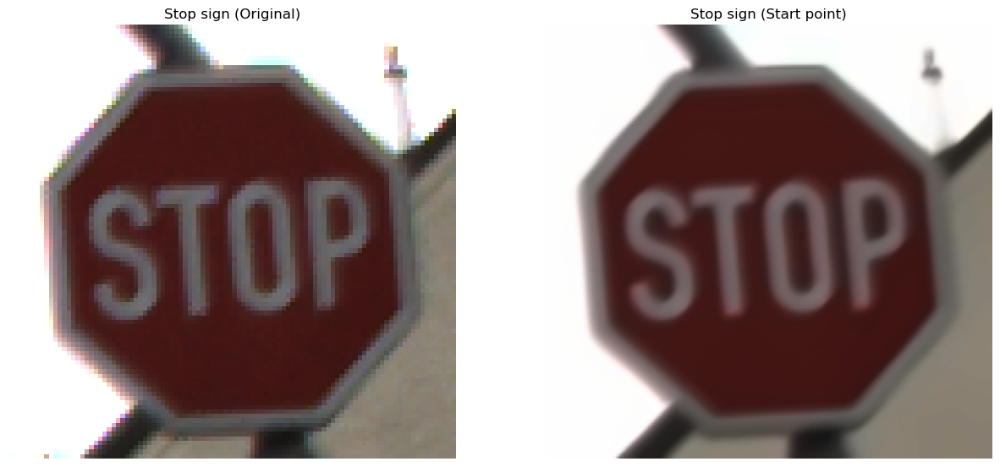

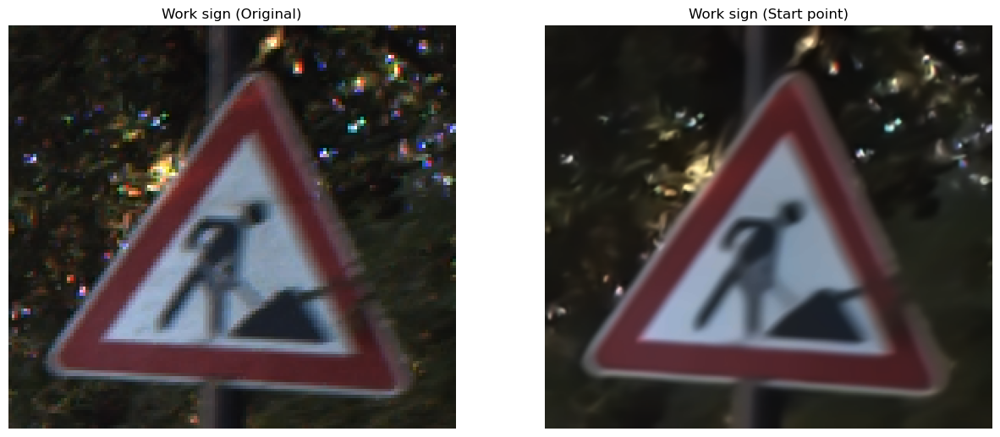

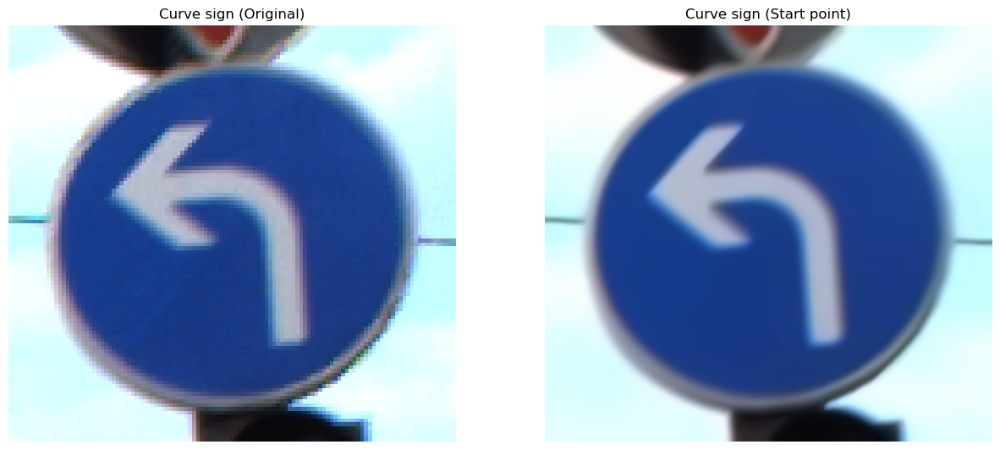

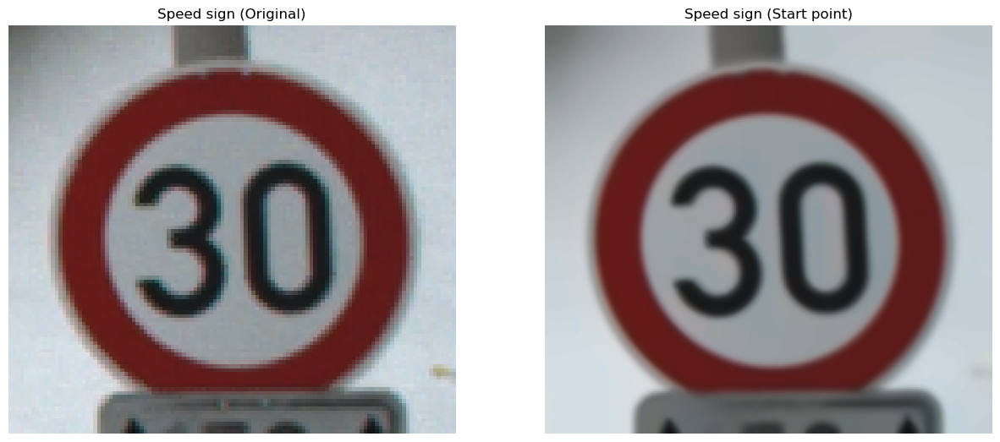

In [49]:
initial_images = list(
    map(
        lambda image: reduce_noise(image, 10, 10, 9, 25),
        enhanced_images_resolution
    )
)

for i in range(len(images_info)):
    subplot_images(
        images=[original_images[i], initial_images[i]],
        image_names=[
            f"{image_names[i]} (Original)", f"{image_names[i]} (Start point)"]
    )

### **Espacio de colores**

<p style='text-align: justify'>
    Exploraremos diversos espacios de color en una de las imagenes para determinar su utilidad en nuestro análisis.
<p>


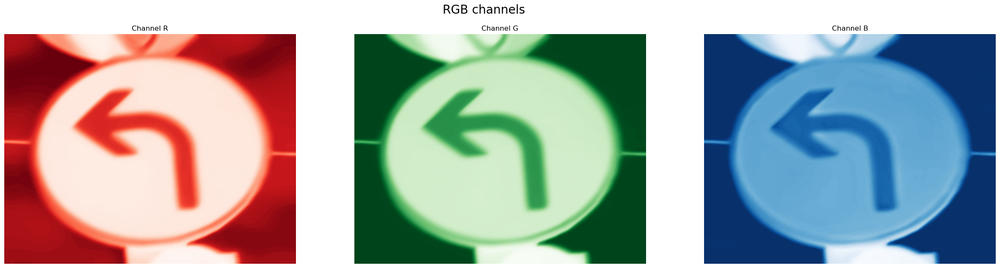

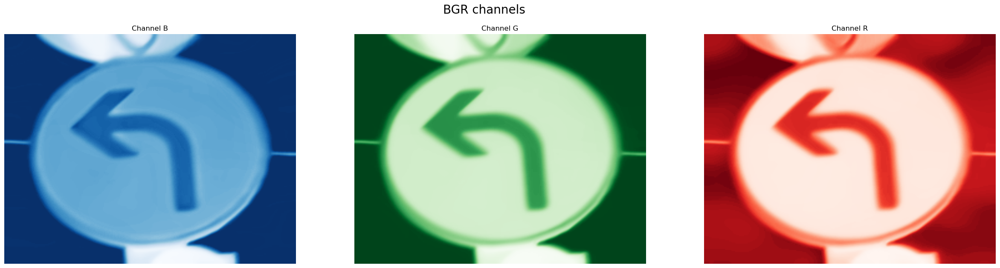

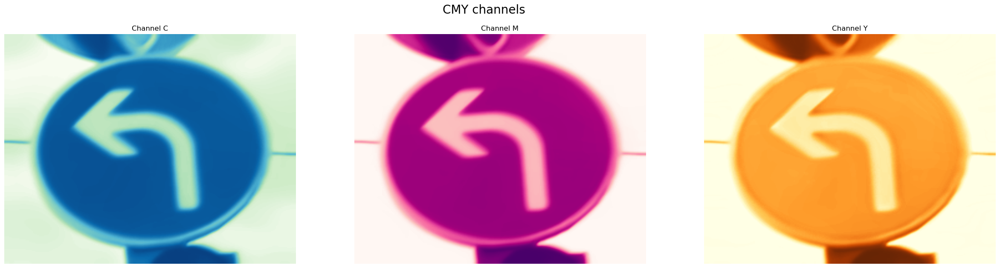

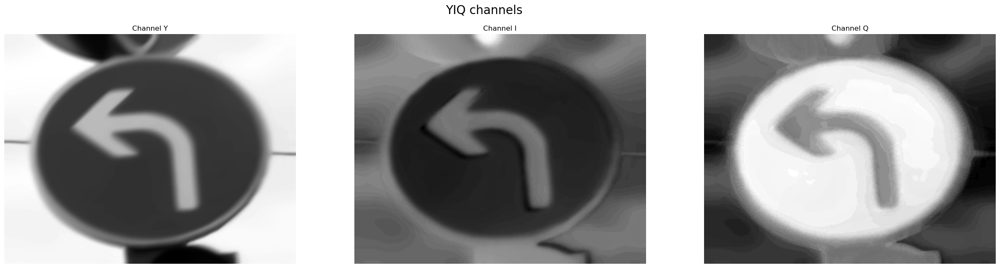

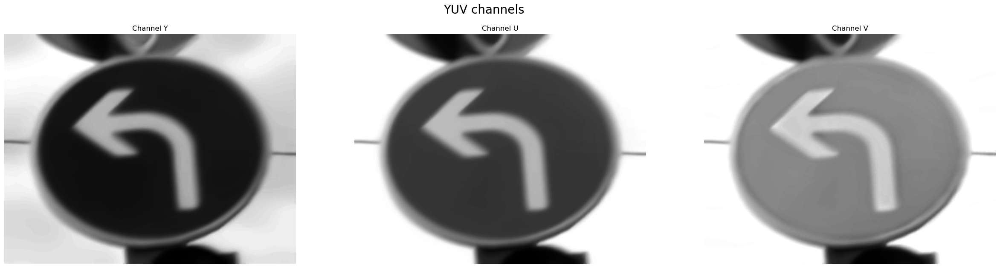

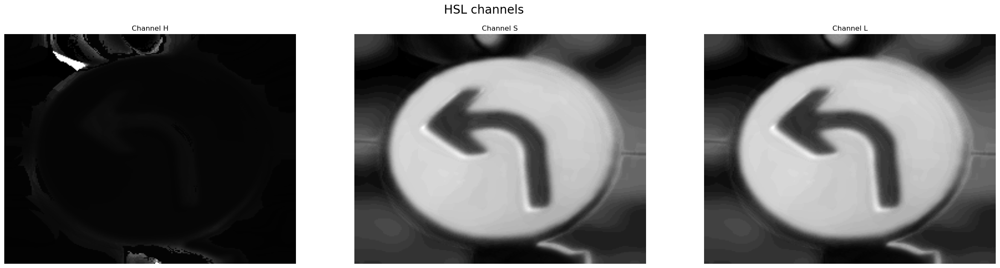

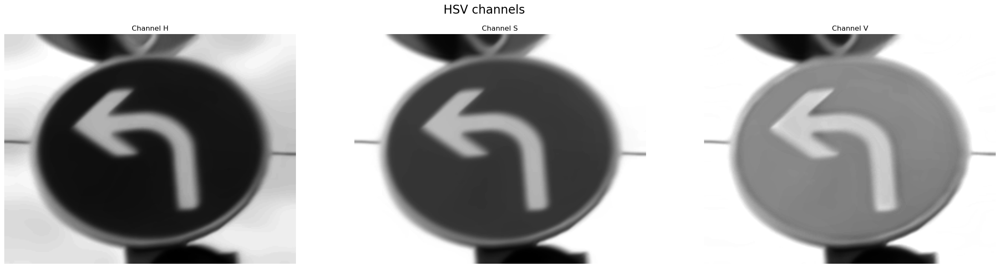

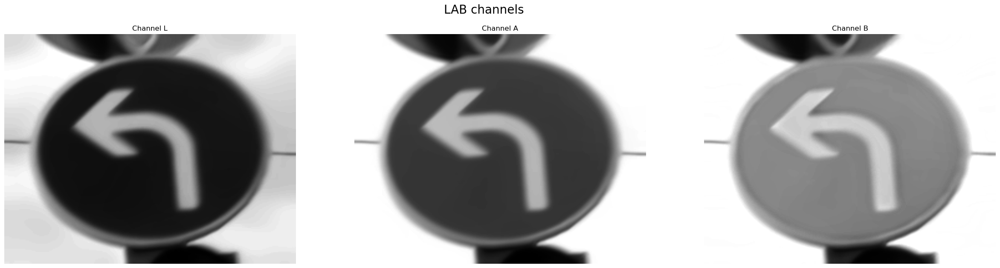

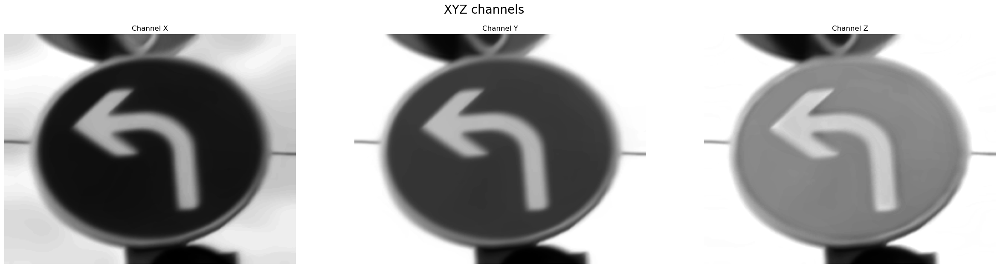

In [50]:
color_space = ["rgb", "bgr", "cmy", "yiq", "yuv", "hsl", "hsv", "lab", "xyz"]
for mode in color_space:
    plot_channels(
        image=initial_images[2],
        mode=mode,
        title=f"{mode.upper()} channels"
    )

<p style='text-align: justify'>
    Como resultado de nuestra evaluación, identificamos que, aunque diversos espacios de color pueden contribuir a nuestro análisis, no son suficientes para alcanzar los resultados óptimos. Entre los espacios y canales evaluados, el canal Y del espacio de color YIQ, que representa la luminancia o componente de brillo de la imagen, mostró potencial. Sin embargo, hemos decidido descartar esta técnica para nuestro análisis específico, dado que no se alinea completamente con nuestros objetivos de procesamiento de imagen.
<p>

<p style='text-align: justify'>
    Por ello, decidimos enfocarnos en otras técnicas que incluyen procesos de restauración, filtrado y transformación para mejorar la calidad de las imágenes.
<p>


### **Histograma**


<p style='text-align: justify'>
    Analizaremos cómo los histogramas pueden contribuir a nuestro análisis. Queremos determinar si la manipulación de los histogramas puede mejorar la calidad de las imágenes.
<p>


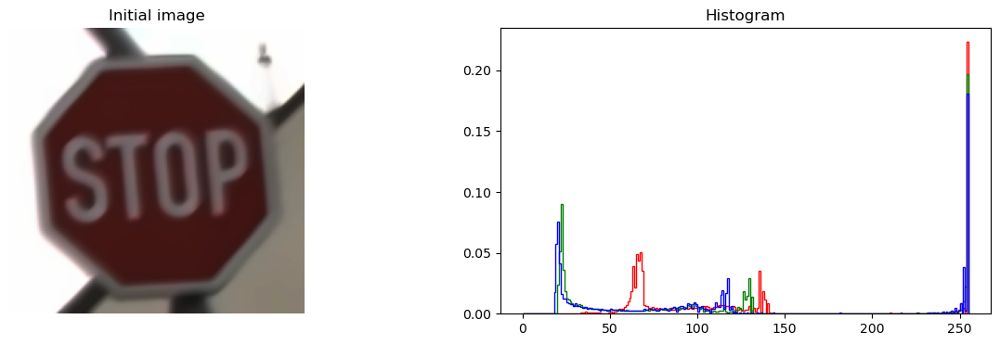

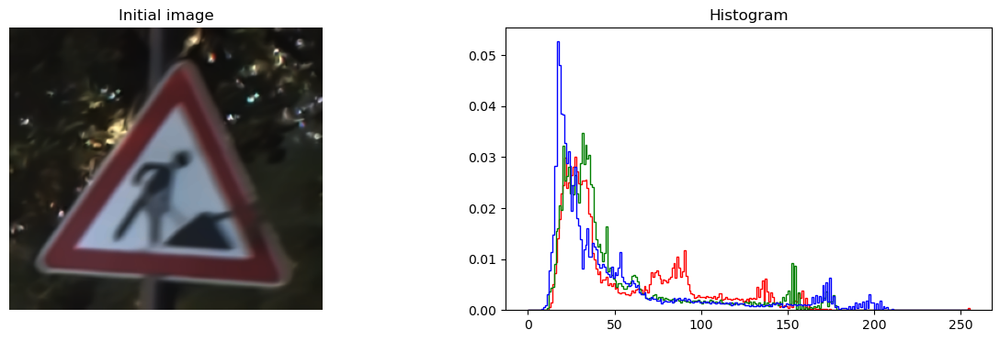

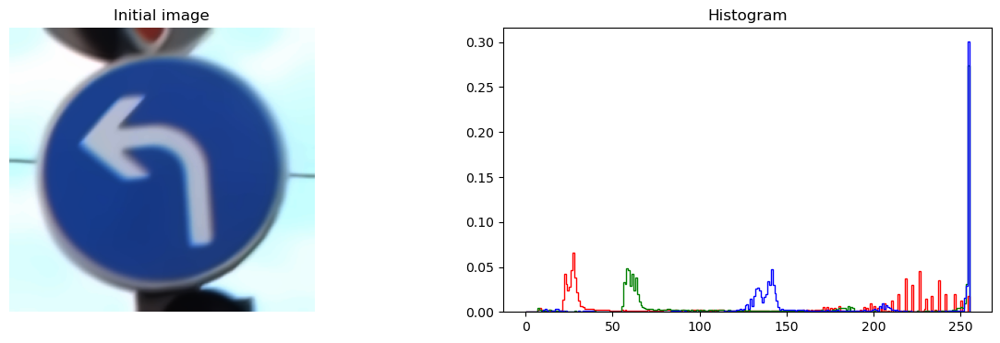

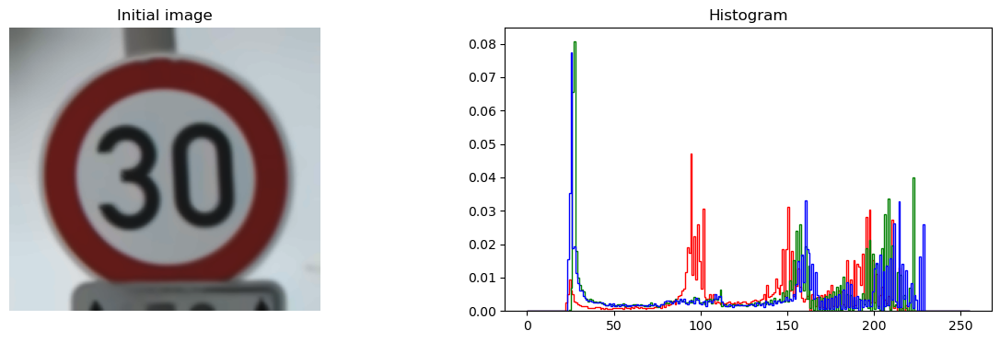

In [51]:
for image in initial_images:
    plot_image_and_histogram(
        image,
        image_title="Initial image",
        hist_title="Histogram"
    )

<p style='text-align: justify'>
    No observamos una correlación clara entre las imágenes y sus histogramas. Por ello, intentaremos realizar operaciones de expansión y ecualización de los histogramas para analizar si logramos alguna mejora en la calidad de las imágenes.
<p>


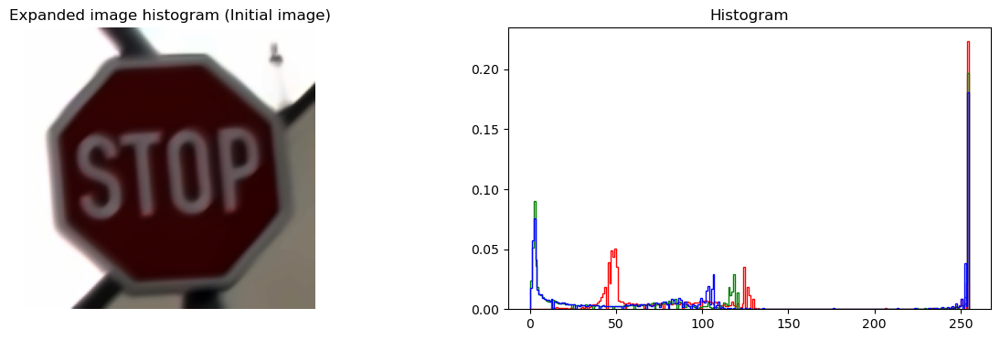

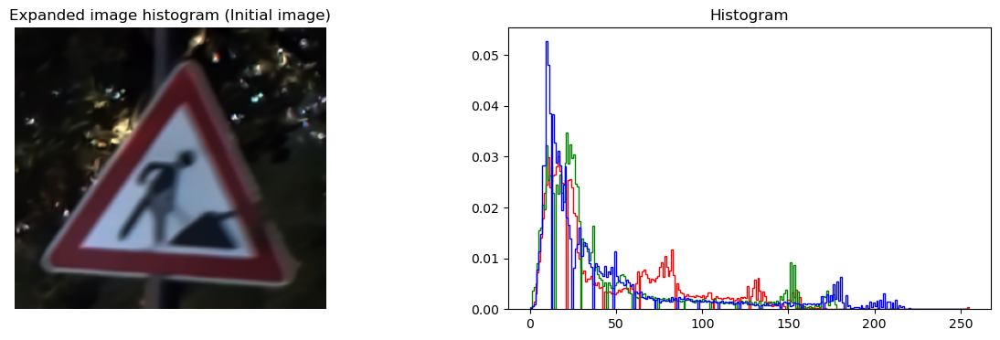

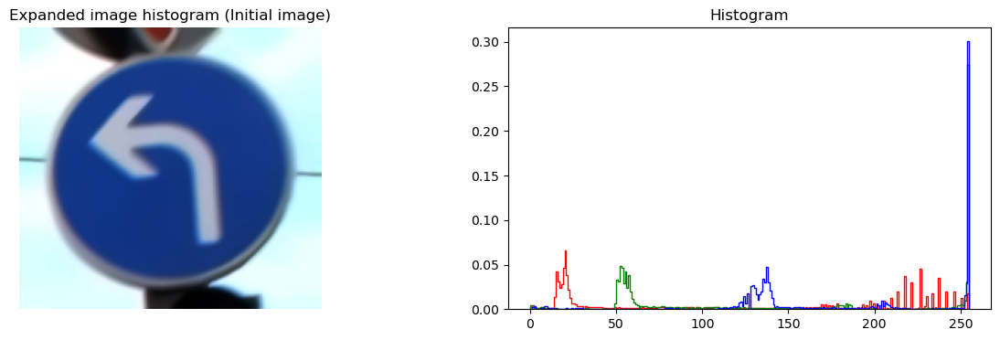

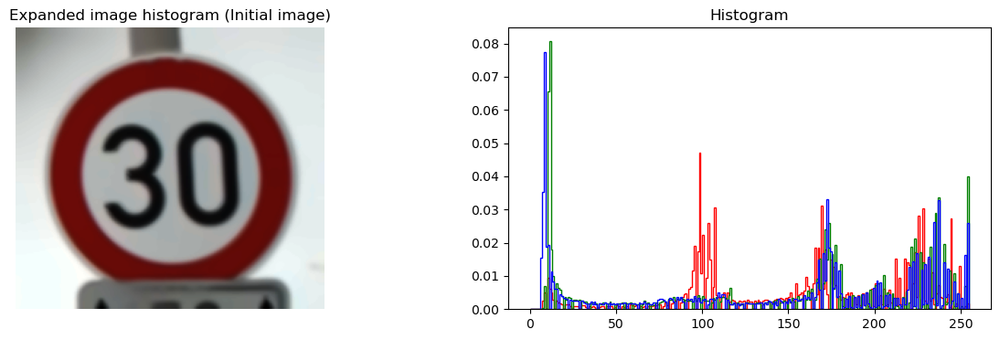

In [52]:
for images in initial_images:
    expanded_image = histogram_expansion(images)
    plot_image_and_histogram(
        expanded_image,
        image_title="Expanded image histogram (Initial image)",
        hist_title="Histogram"
    )

<p style='text-align: justify'>
    Con esta ampliación no vemos una mejora representativa o significativa, por lo que podemos descartar esta técnica.
<p>


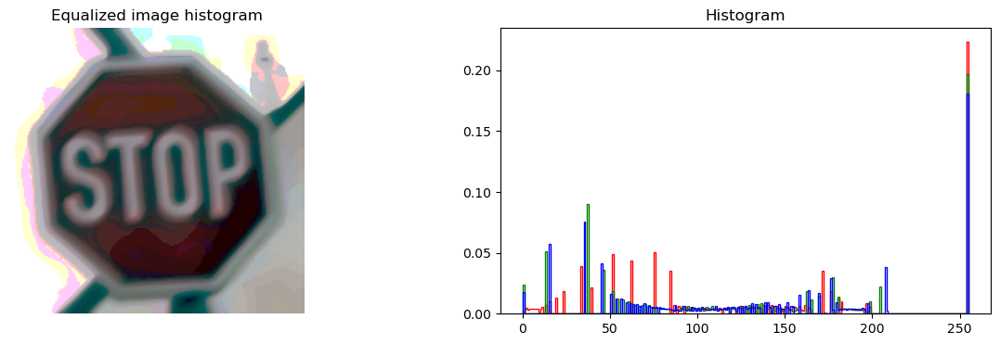

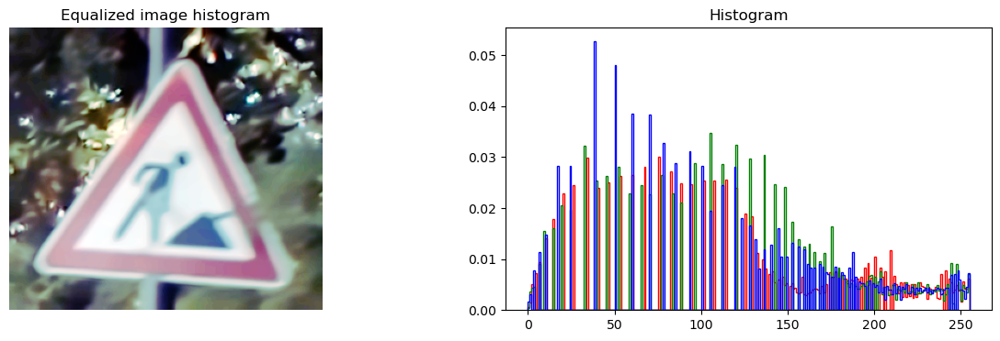

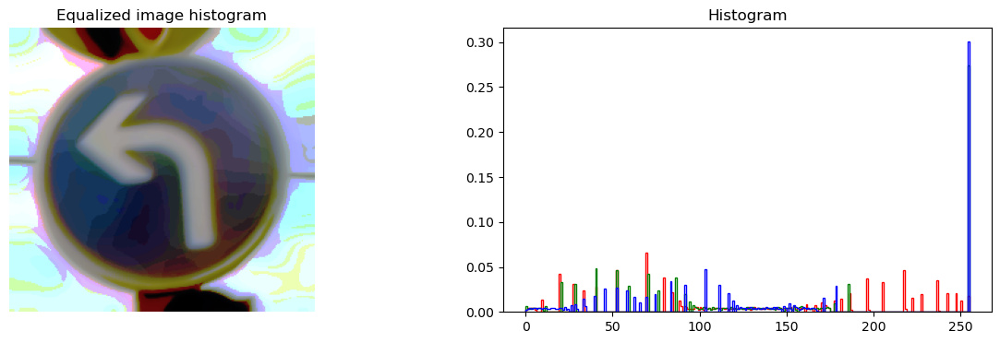

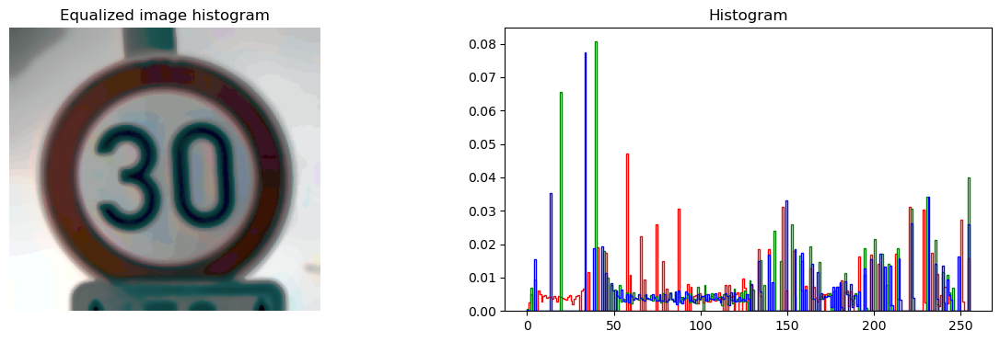

In [53]:
for image in initial_images:
    equalized_histogram = apply_transformation(image, equalize_histogram, [])
    plot_image_and_histogram(
        equalized_histogram,
        image_title="Equalized image histogram",
        hist_title="Histogram"
    )

<p style='text-align: justify'>
    Al aplicar la ecualización, observamos que la calidad de las imágenes disminuye, llenándose de manchas y empeorando significativamente. Por lo tanto, descartamos las operaciones de histograma y decidimos no utilizar esta técnica.
<p>


### **Filtrado**

<p style='text-align: justify'>
    Aplicaremos diversos filtros sobre las imágenes para evaluar su comportamiento mediante diferentes métodos de filtrado.
<p>


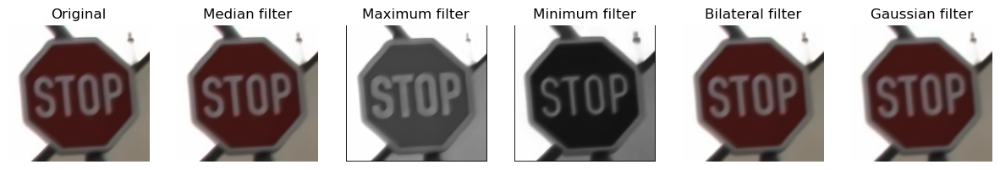

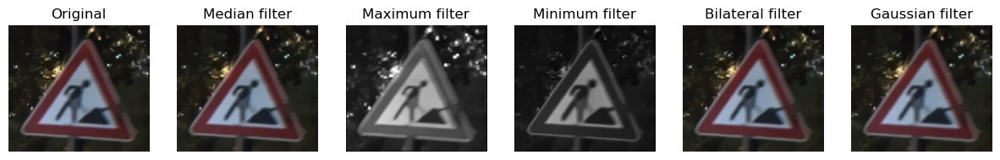

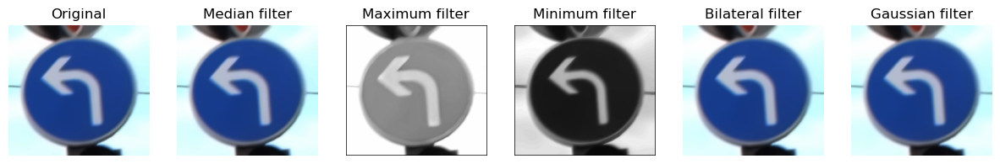

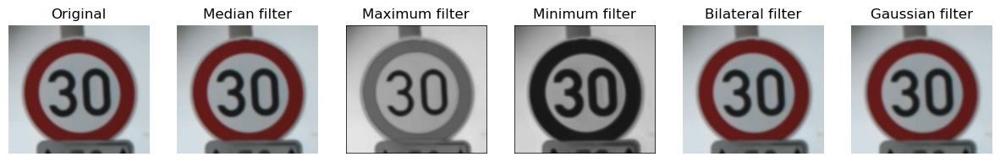

In [54]:
for image in initial_images:
    size = 3
    subplot_images(
        images=[
            image,
            median_filter(image, size),
            maximum_filter(image, size),
            minimum_filter(image, size),
            bilateral_filter(image, size, 250, 250),
            gaussian_filter(image, size, 250),
        ],
        image_names=[
            "Original",
            "Median filter",
            "Maximum filter",
            "Minimum filter",
            "Bilateral filter",
            "Gaussian filter",
        ]
    )

<p style='text-align: justify'>
    Tras un análisis detallado, observamos que los filtros aplicados no produjeron cambios significativos en las imágenes, con la excepción de los filtros mínimos y máximos.
<p>


### **Corrección gamma**

<p style='text-align: justify'>
    Usamos la transformación gamma para mejorar el contraste de las imágenes y realzar algunos detalles. Esta técnica ajusta el brillo y el contraste mediante dos parámetros: <code>a</code> y <code>&gamma;</code>. El parámetro <code>a</code> es un factor de escala que controla el contraste de la imagen, mientras que <code>&gamma;</code> ajusta la curva de brillo, afectando cómo se distribuyen los tonos oscuros y claros en la imagen. Iteramos estos parámetros con el objetivo de observar cómo su combinación puede influir en la mejora de nuestras imágenes. Para ello, variamos un parámetro mientras mantenemos el otro estático y viceversa. Esto nos proporcionará una buena aproximación para escoger los parámetros apropiados para nuestras imágenes.
<p>


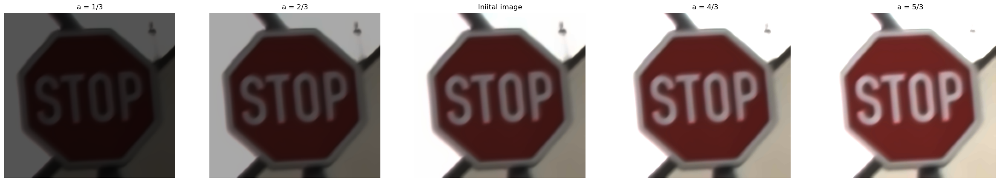

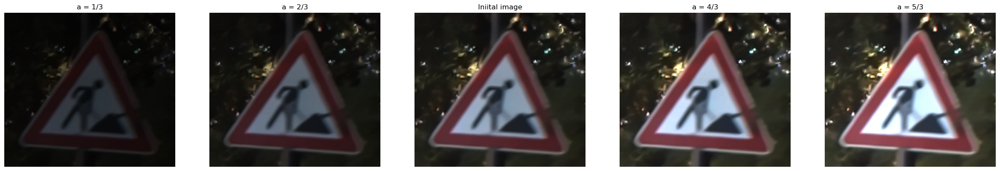

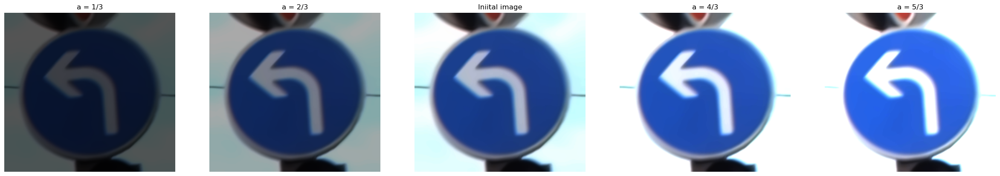

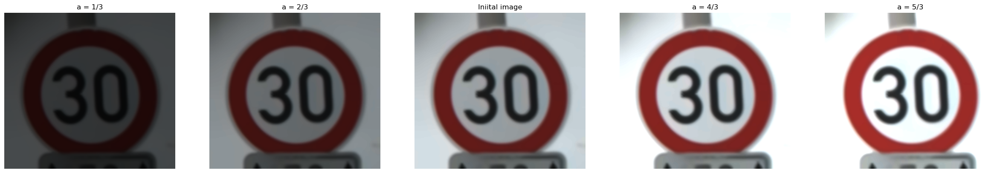

In [55]:
for image in initial_images:
    a_tested_images = []
    a_image_names = [
        "a = 1/3",
        "a = 2/3",
        "Iniital image",
        "a = 4/3",
        "a = 5/3"
    ]
    for i in range(1, 6):
        image_result = apply_transformation(
            image, gamma_correction, [i/3, 1])
        a_tested_images.append(image_result)
    subplot_images(
        images=a_tested_images,
        image_names=a_image_names,
        figsize=(30, 7)
    )

<p style='text-align: justify'>
    En estas imágenes, variamos el parámetro <code>a</code> mientras mantenemos constante el factor <code>&gamma; = 1</code>. Observamos que este parámetro efectivamente controla el contraste y que la calidad mejora notablemente con valores entre 1 y 2. Sin embargo, los valores fuera de este rango no representan una mejora en la calidad de las imágenes.
<p>


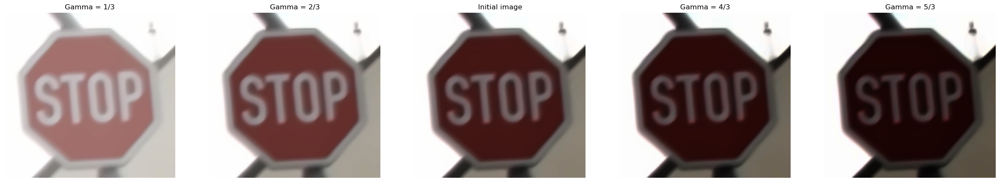

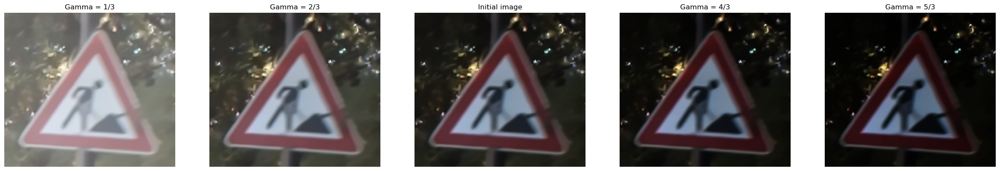

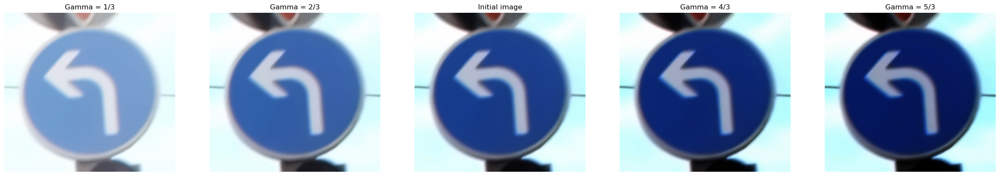

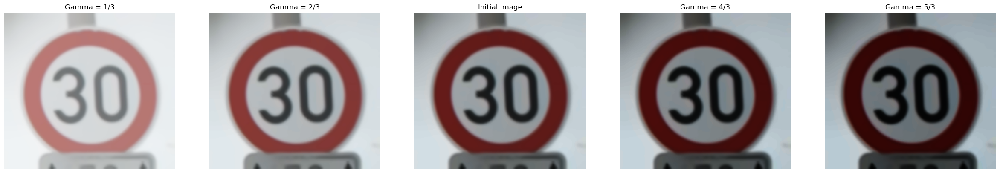

In [56]:
for image in initial_images:
    gamma_tested_images = []
    gamma_image_names = [
        "Gamma = 1/3",
        "Gamma = 2/3",
        "Initial image",
        "Gamma = 4/3",
        "Gamma = 5/3"
    ]
    for i in range(1, 6):
        image_result = apply_transformation(
            image, gamma_correction, [1, i/3])
        gamma_tested_images.append(image_result)
    subplot_images(
        images=gamma_tested_images,
        image_names=gamma_image_names,
        figsize=(30, 7)
    )

<p style='text-align: justify'>
    Podemos observar que la variación del parámetro <code>&gamma;</code> controla el brillo de las imágenes, y los valores entre 1 y 2 son los más favorables para mejorar su calidad.
<p>

<p style='text-align: justify'>
    Después de realizar varias iteraciones, encontramos que los valores de los parámetros que ofrecen la mejor calidad son <code>a = 1.5</code> y <code>&gamma; = 1.2</code>.
<p>


### **Imágenes preprocesadas**


<p style='text-align: justify'>
    Luego de analizar diferentes métodos y descartar algunos que no aportaron mejoras significativas a nuestras imágenes, concluimos que la corrección gamma es la técnica que ofrece la mejora más notable. Las imágenes preprocesadas, almacenadas en <code>preprocessed_images</code>, son el resultado final de esta etapa del proyecto. Estas imágenes han pasado por un proceso de mejora de resolución, reducción de ruido y corrección gamma, alcanzando así la mejor calidad posible para la siguiente fase del proyecto.
<p>


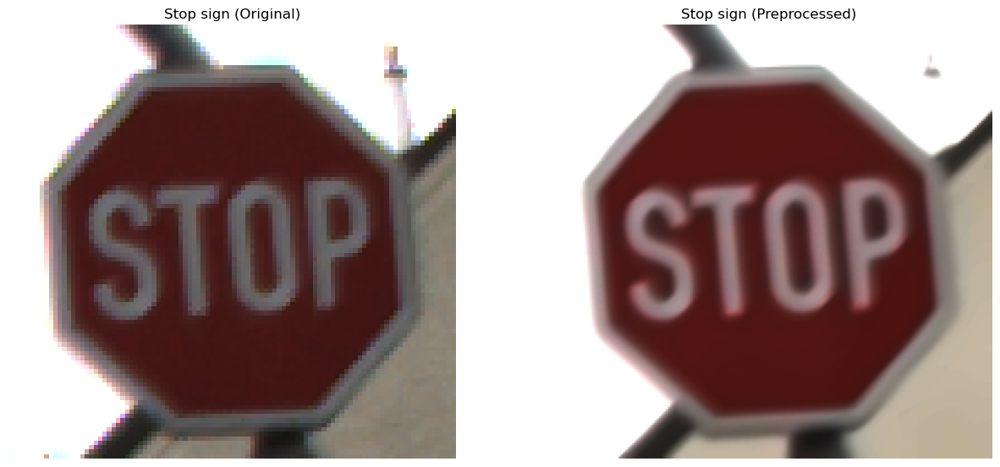

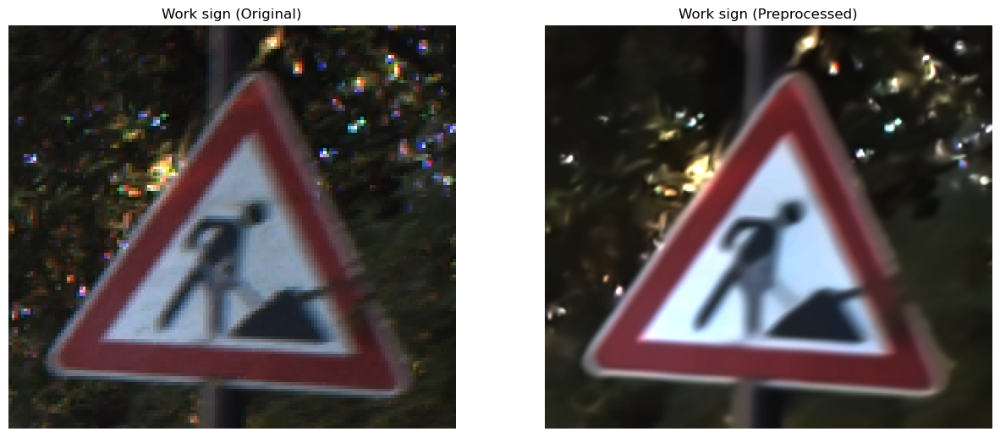

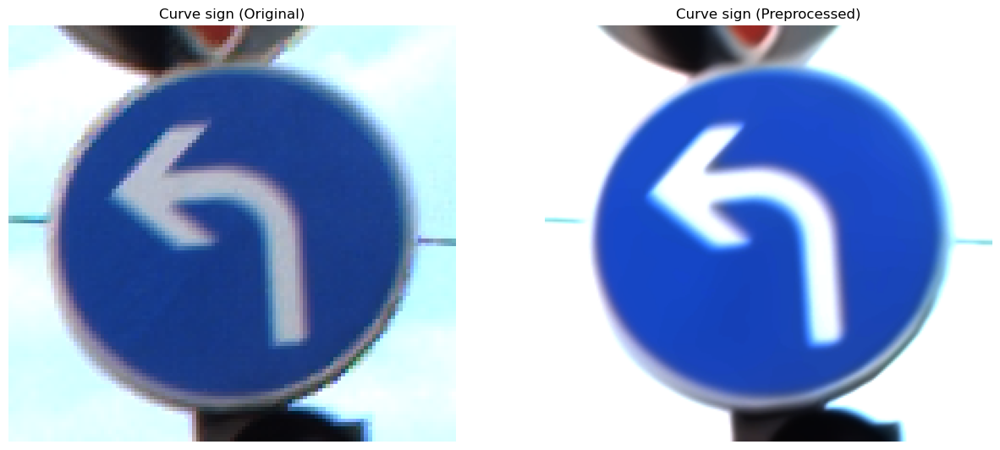

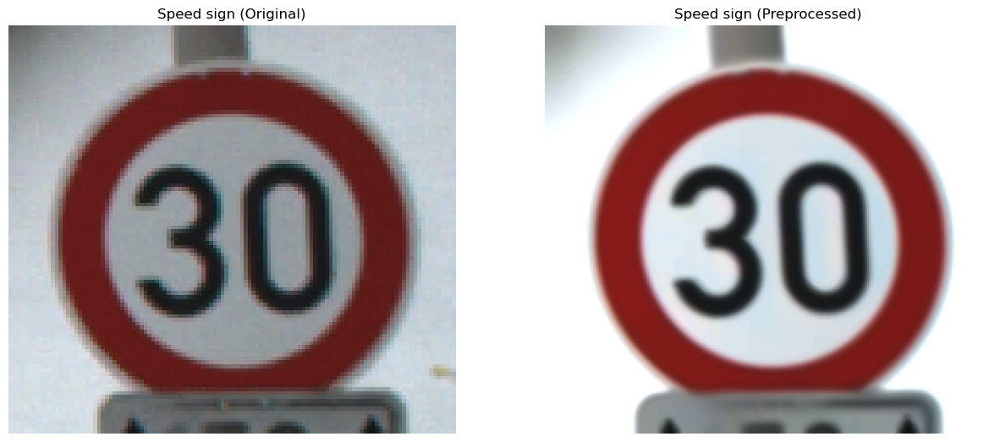

In [63]:
preprocessed_image = list(
    map(
        lambda image: apply_transformation(image, gamma_correction, [1.6, 1.2]),
        initial_images
    )
)

for i in range(len(images_info)):
    subplot_images(
        images=[original_images[i], preprocessed_image[i]],
        image_names=[
            f"{image_names[i]} (Original)", f"{image_names[i]} (Preprocessed)"]
    )
